## Business objectives
Customer churn is a big problem for telecommunications companies. Indeed, their annual churn rates are usually higher than 10%. For that reason, they develop strategies to keep as many clients as possible. This is a classification project since the variable to be predicted is binary (churn or loyal customer). The goal here is to model churn probability, conditioned on the customer features.

### 1. Importing Libraries

In [90]:
#Importing the required packages
import pandas as pd
import numpy as np
#importing Visualization Packages
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import LabelEncoder

### 2. Import Dataset

In [91]:
churn_data = pd.read_csv("churn.csv")
churn_data

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no


In [92]:
churn_data.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [93]:
churn_data.tail()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no
4999,5000,VT,area_code_415,86,yes,34,no,9.3,16,2.51,...,102,22,267.1,104,22.70,154.8,100,6.97,0,no


### 3. Data Understanding

#### Initial Analysis

In [94]:
churn_data.shape

(5000, 21)

In [95]:
print('features of data set :',churn_data.columns)

features of data set : Index(['Unnamed: 0', 'state', 'area.code', 'account.length', 'voice.plan',
       'voice.messages', 'intl.plan', 'intl.mins', 'intl.calls', 'intl.charge',
       'day.mins', 'day.calls', 'day.charge', 'eve.mins', 'eve.calls',
       'eve.charge', 'night.mins', 'night.calls', 'night.charge',
       'customer.calls', 'churn'],
      dtype='object')


In [96]:
churn_data.describe()

,Unnamed: 0,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,1443.520003,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.000000,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1250.750000,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,2500.500000,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,3750.250000,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,5000.000000,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [97]:
churn_data.dtypes

Unnamed: 0          int64
state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge         object
eve.mins           object
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

In [98]:
churn_data.select_dtypes(include=['object'])

,state,area.code,voice.plan,intl.plan,day.charge,eve.mins,churn
0,KS,area_code_415,yes,no,45.07,197.4,no
1,OH,area_code_415,yes,no,27.47,195.5,no
2,NJ,area_code_415,no,no,41.38,121.2,no
3,OH,area_code_408,no,yes,50.9,61.9,no
4,OK,area_code_415,no,yes,28.34,148.3,no
...,...,...,...,...,...,...,...
4995,HI,area_code_408,yes,no,40.07,223,no
4996,WV,area_code_415,no,no,31.31,256.8,yes
4997,DC,area_code_415,no,no,23.9,172.8,no
4998,DC,area_code_510,no,no,32.1,171.7,no


In [99]:
churn_data.isna().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

In [100]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

In [101]:
churn_data.iloc[10:15]

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
10,11,IN,area_code_415,65,no,0,no,12.7,6,3.43,...,137,21.95,228.5,83,19.42,208.8,111,9.40,4,yes
11,12,RI,area_code_415,74,no,0,no,9.1,5,2.46,...,127,31.91,163.4,148,13.89,196.0,94,8.82,0,no
12,13,IA,area_code_408,168,no,0,no,11.2,2,3.02,...,96,Nan,104.9,71,8.92,141.1,128,6.35,1,no
13,14,MT,area_code_510,95,no,0,no,12.3,5,3.32,...,88,26.62,247.6,75,21.05,192.3,115,8.65,3,no
14,15,IA,area_code_415,62,no,0,no,13.1,6,3.54,...,70,20.52,307.2,76,26.11,203.0,99,9.14,4,no


In [102]:
churn_data.iloc[101:111]

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
101,102,MA,area_code_415,108,no,0,no,14.6,5,3.94,...,137,30.31,189,76,16.07,129.1,102,5.81,0,no
102,103,VT,area_code_415,135,no,0,no,10.5,6,2.84,...,82,25.79,Nan,105,10.12,180.0,100,8.10,0,no
103,104,KY,area_code_408,95,no,0,no,12.5,9,3.38,...,99,22.95,183.6,106,15.61,245.3,102,11.04,1,no
104,105,IN,area_code_408,122,no,0,no,11.3,2,3.05,...,94,28.99,173.7,109,14.76,248.6,75,11.19,1,no
105,106,AZ,area_code_408,95,no,0,no,11.8,4,3.19,...,65,40.48,187.2,98,15.91,190.0,115,8.55,4,no
106,107,MI,area_code_510,36,yes,29,no,9.0,6,2.43,...,102,47.84,202.2,76,17.19,187.2,113,8.42,2,no
107,108,NM,area_code_510,93,yes,21,no,9.8,3,2.65,...,131,20.04,164.5,115,13.98,217.0,86,9.76,1,no
108,109,CO,area_code_415,141,yes,32,no,10.1,1,2.73,...,91,25.26,131.1,97,11.14,219.4,142,9.87,1,no
109,110,UT,area_code_408,157,no,0,no,9.6,7,2.59,...,90,39.07,147.9,121,12.57,241.4,108,10.86,3,no
110,111,MI,area_code_408,120,no,0,no,8.3,8,2.24,...,100,28.05,Nan,83,26.96,119.2,86,5.36,1,no


### Here we can see both "Day Charges" and "Eve Minutes" are idenitfied as object datatype
* Even though data inside both is in float there is Nan Value
* so we need to convert string Nan to np.Nan
* And drop the Nan values
* Change the Datatypes

In [103]:
nan_value = np.nan
type(nan_value)

float

In [104]:
churn_data["day.charge"] = churn_data["day.charge"].replace("Nan",nan_value)

In [105]:
churn_data["eve.mins"] = churn_data["eve.mins"].replace("Nan",nan_value)

In [106]:
churn_data.isna().sum()

Unnamed: 0         0
state              0
area.code          0
account.length     0
voice.plan         0
voice.messages     0
intl.plan          0
intl.mins          0
intl.calls         0
intl.charge        0
day.mins           0
day.calls          0
day.charge         7
eve.mins          24
eve.calls          0
eve.charge         0
night.mins         0
night.calls        0
night.charge       0
customer.calls     0
churn              0
dtype: int64

In [107]:
churn_data.dropna(inplace=True)

In [108]:
churn_data.isna().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

In [109]:
# Dropping Unwanted Columns
churn_data.drop("Unnamed: 0",axis=1,inplace=True)

In [110]:
#converting day.charges and eve.mins from object to float
churn_data["day.charge"] = churn_data["day.charge"].astype(float)
churn_data["eve.mins"] = churn_data["eve.mins"].astype(float)

In [111]:
churn_data.dtypes

state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge        float64
eve.mins          float64
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

In [112]:
churn_data.shape

(4969, 20)

#### There were total of 31 null values present in our data

In [114]:
churn_data["churn"].value_counts()

no     4264
yes     705
Name: churn, dtype: int64

### Data is Cleaned

In [115]:
churn_data.nunique()

state               51
area.code            3
account.length     218
voice.plan           2
voice.messages      48
intl.plan            2
intl.mins          170
intl.calls          21
intl.charge        170
day.mins          1957
day.calls          123
day.charge        1957
eve.mins          1875
eve.calls          126
eve.charge        1655
night.mins        1849
night.calls        131
night.charge      1028
customer.calls      10
churn                2
dtype: int64

In [116]:
churn_data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
state,4969,51,WV,158,NaN,NaN,NaN,NaN,NaN,NaN,NaN
area.code,4969,3,area_code_415,2479,NaN,NaN,NaN,NaN,NaN,NaN,NaN
account.length,4969.0,NaN,NaN,NaN,100.206681,39.695476,1.0,73.0,100.0,127.0,243.0
voice.plan,4969,2,no,3654,NaN,NaN,NaN,NaN,NaN,NaN,NaN
voice.messages,4969.0,NaN,NaN,NaN,7.75488,13.545738,0.0,0.0,0.0,17.0,52.0
intl.plan,4969,2,no,4499,NaN,NaN,NaN,NaN,NaN,NaN,NaN
intl.mins,4969.0,NaN,NaN,NaN,10.264198,2.761996,0.0,8.5,10.3,12.0,20.0
intl.calls,4969.0,NaN,NaN,NaN,4.433085,2.459495,0.0,3.0,4.0,6.0,20.0
intl.charge,4969.0,NaN,NaN,NaN,2.771851,0.745672,0.0,2.3,2.78,3.24,5.4
day.mins,4969.0,NaN,NaN,NaN,180.306178,53.931206,0.0,143.7,180.1,216.2,351.5


In [117]:
churn_data[churn_data.duplicated()]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn


<function matplotlib.pyplot.show(close=None, block=None)>

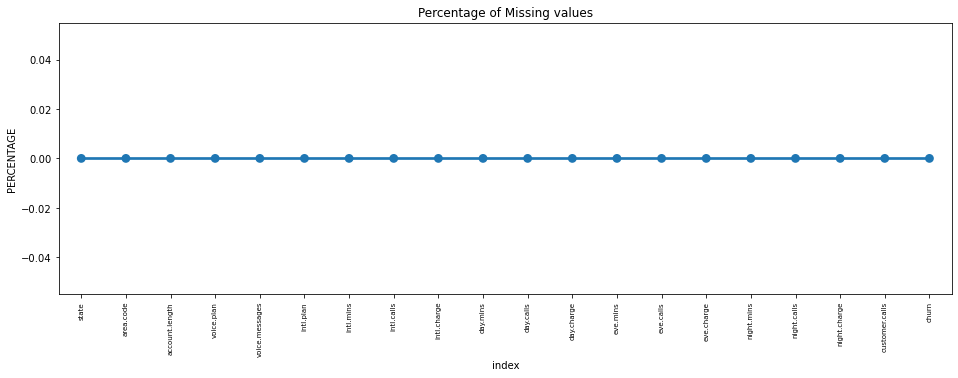

In [118]:
# % Missing Value visualization

missing = pd.DataFrame((churn_data.isnull().sum())*100/churn_data.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation =90,fontsize =7)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show

In [119]:
len(churn_data[churn_data.duplicated()])

0

* As of now There are 4969 rows and 20 columns in above dataset.

* out of which there are 8 float data type,

* 7 integer data type,

* 5 object data type i.e catagarical value are there.

* There are no missing value present so no need to do the missing value imputation,

* And also there are no duplicate value present.

## Missing Data - Initial Intuition
- Here, we don't have any missing data.
General Thumb Rules:

- For features with less missing values- can use regression to predict the missing values or fill with the mean of the values present, depending on the feature.
- For features with very high number of missing values- it is better to drop those columns as they give very less insight on analysis.
- As there's no thumb rule on what criteria do we delete the columns with high number of missing values, but generally you can delete the columns, if you have more than 30-40% of missing values.

In [120]:
churn_data.dtypes

state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge        float64
eve.mins          float64
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

###  Correlation Analysis

In [121]:
churn_data.corr()

,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
account.length,1.000000,-0.013682,0.004165,0.014686,0.004173,-0.000715,0.027558,-0.000717,-0.007600,0.008187,-0.007597,0.001229,-0.008077,0.001218,-0.002457
voice.messages,-0.013682,1.000000,0.001497,-0.000970,0.001539,0.005641,0.001008,0.005636,0.018517,-0.003682,0.018523,0.004094,0.001903,0.004086,-0.006676
intl.mins,0.004165,0.001497,1.000000,0.016604,0.999993,-0.018335,0.014284,-0.018339,-0.000533,-0.006097,-0.000539,-0.006178,0.000429,-0.006174,-0.010839
intl.calls,0.014686,-0.000970,0.016604,1.000000,0.016714,-0.000541,0.011457,-0.000544,0.007402,0.006675,0.007407,-0.017202,0.000008,-0.017172,-0.019519
intl.charge,0.004173,0.001539,0.999993,0.016714,1.000000,-0.018261,0.014348,-0.018265,-0.000512,-0.006151,-0.000518,-0.006119,0.000411,-0.006114,-0.010893
day.mins,-0.000715,0.005641,-0.018335,-0.000541,-0.018261,1.000000,-0.000342,1.000000,-0.011572,0.006587,-0.011581,0.011755,0.004091,0.011738,0.002573
day.calls,0.027558,0.001008,0.014284,0.011457,0.014348,-0.000342,1.000000,-0.000342,-0.001526,0.001984,-0.001522,0.002023,-0.008645,0.002019,-0.010938
day.charge,-0.000717,0.005636,-0.018339,-0.000544,-0.018265,1.000000,-0.000342,1.000000,-0.011568,0.006588,-0.011578,0.011757,0.004090,0.011740,0.002567
eve.mins,-0.007600,0.018517,-0.000533,0.007402,-0.000512,-0.011572,-0.001526,-0.011568,1.000000,0.002429,1.000000,-0.017189,0.016336,-0.017191,-0.011936
eve.calls,0.008187,-0.003682,-0.006097,0.006675,-0.006151,0.006587,0.001984,0.006588,0.002429,1.000000,0.002444,0.002049,-0.012014,0.002068,0.005985


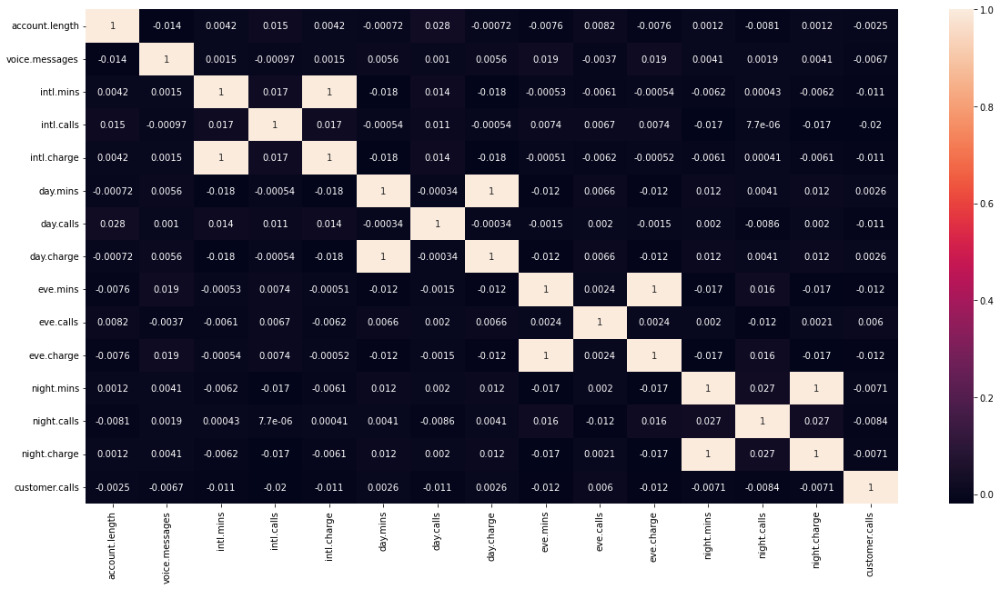

In [122]:
plt.figure(figsize=(20,10))
sns.heatmap(churn_data.corr(),annot=True)
plt.show()

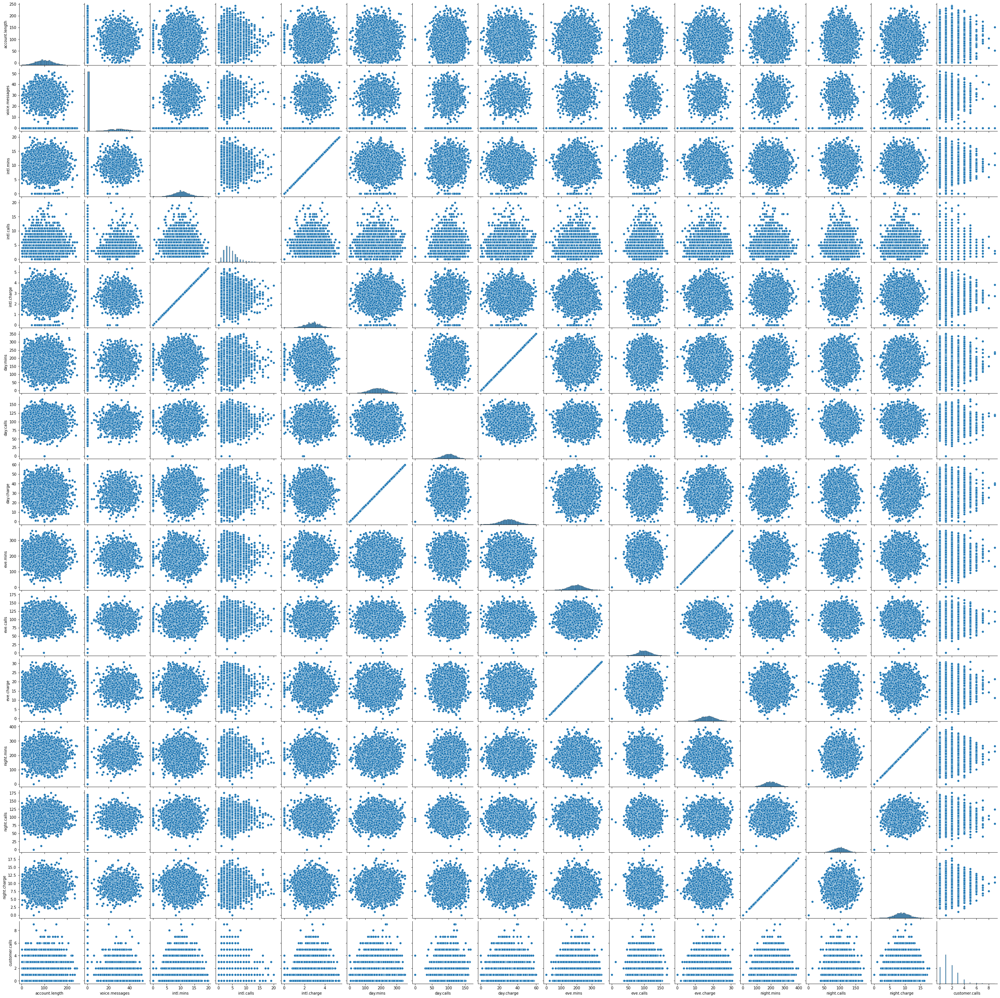

In [123]:
sns.pairplot(data=churn_data)

## Exploratory Data Analysis (EDA)


In [124]:
#unique value inside 'churn' column
churn_data['churn'].unique()

array(['no', 'yes'], dtype=object)

In [126]:
#count of true & false in ' churn'
churn_data.churn.value_counts()

no     4264
yes     705
Name: churn, dtype: int64

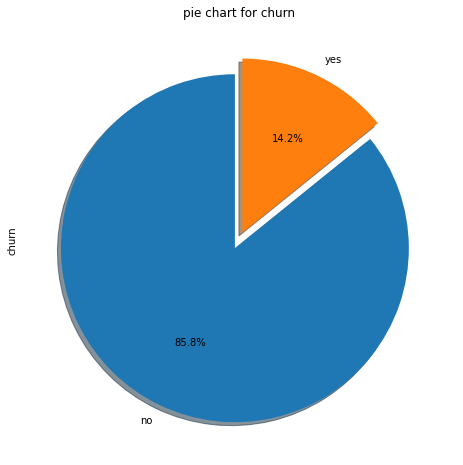

In [128]:
#pie chart to analysis to churn
churn_data['churn'].value_counts().plot.pie(explode=[0.05,0.05],autopct='%1.1f%%',startangle=90,shadow=True,figsize=(8,8))
plt.title('pie chart for churn')
plt.show()

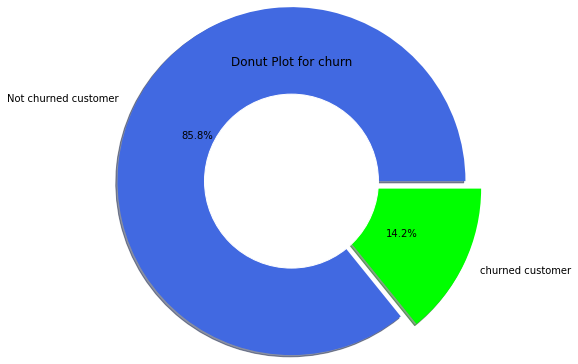

In [130]:
#To get the Donut Plot to analyze churn
data = churn_data['churn'].value_counts()
explode = (0, 0.2)
plt.pie(data, explode = explode,autopct='%1.1f%%',shadow=True,radius = 2.0, labels = ['Not churned customer','churned customer'],colors=['royalblue' ,'lime'])
circle = plt.Circle( (0,0), 1, color='white')
p=plt.gcf()
p.gca().add_artist(circle)
plt.title('Donut Plot for churn')
plt.show()

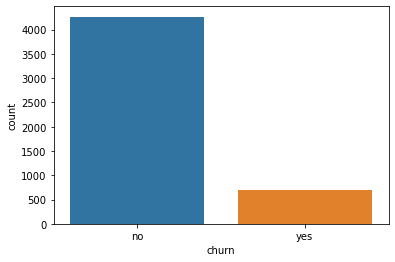

In [132]:
#let's see churn by using countplot
sns.countplot(x=churn_data.churn)
plt.show()

- After analyzing the churn column, we had little to say like almost 15% of customers have churned.
- let's see what other features say to us and what relation we get after correlated with churn

In [133]:
#printing the unique value of state column
churn_data['state'].nunique()

51

In [134]:
#Separating churn and non churn customers
churn_df     = churn_data[churn_data["churn"] == bool(True)]
not_churn_df = churn_data[churn_data["churn"] == bool(False)]

## Analyzing *Account Length* Column


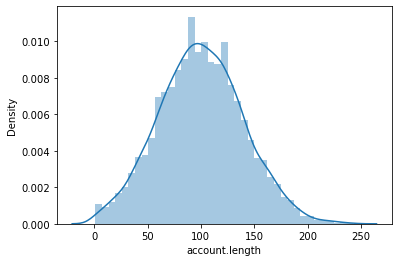

In [135]:
#Account length vs Churn
sns.distplot(churn_data['account.length'])
plt.show()

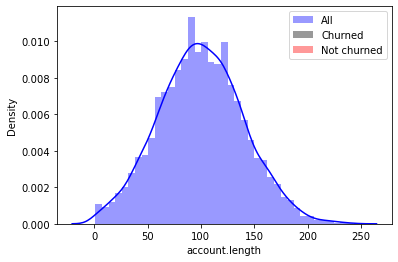

In [138]:
#comparison of churned account length and not churned account length 
sns.distplot(churn_data['account.length'],color = 'blue',label="All")
sns.distplot(churn_df['account.length'],color = "black",hist=True,label="Churned")
sns.distplot(not_churn_df['account.length'],color = 'red',hist= True,label="Not churned")
plt.legend()
plt.show()

## Analyzing *State* Column


In [139]:
#printing the unique value of state column
churn_data['state'].nunique()

51

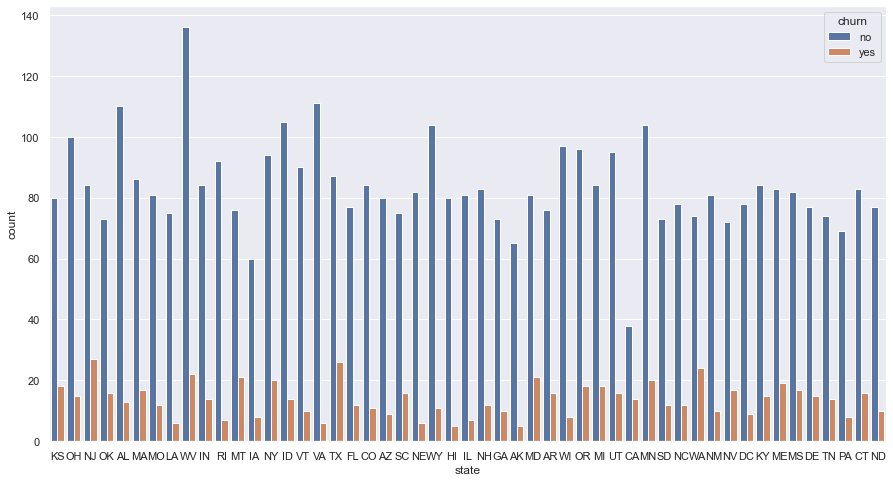

In [140]:
#Comparison churn with state by using countplot
sns.set(style="darkgrid")
plt.figure(figsize=(15,8))
ax = sns.countplot(x='state', hue="churn", data=churn_data)
plt.show()

In [141]:
label_encode=LabelEncoder()
labels=label_encode.fit_transform(churn_data['churn'])
churn_data['Churn']=labels
churn_data.drop(columns='churn',axis=1,inplace=True)

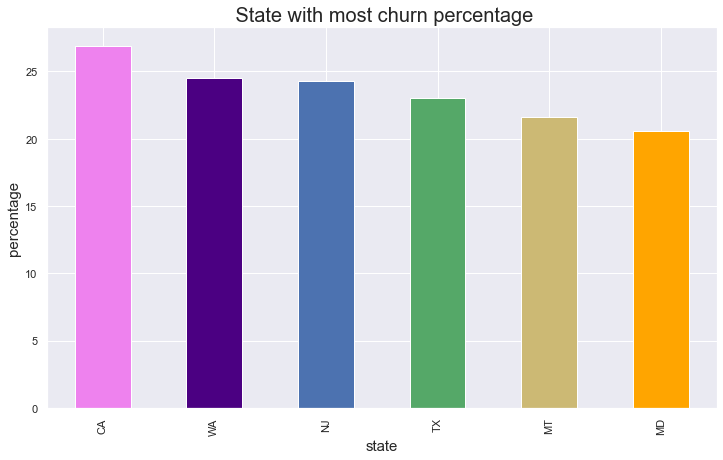

In [142]:
plt.rcParams['figure.figsize'] = (12, 7)
color = plt.cm.copper(np.linspace(0, 0.5, 20))
((churn_data.groupby(['state'])['Churn'].mean())*100).sort_values(ascending = False).head(6).plot.bar(color = ['violet','indigo','b','g','y','orange','r'])
plt.title(" State with most churn percentage", fontsize = 20)
plt.xlabel('state', fontsize = 15)
plt.ylabel('percentage', fontsize = 15)
plt.show()

In [143]:
#calculate State vs Churn percentage
State_data = pd.crosstab(churn_data["state"],churn_data["Churn"])
State_data['Percentage_Churn'] = State_data.apply(lambda x : x[1]*100/(x[0]+x[1]),axis = 1)
print(State_data)

Churn    0   1  Percentage_Churn
state                           
AK      65   5          7.142857
AL     110  13         10.569106
AR      76  16         17.391304
AZ      80   9         10.112360
CA      38  14         26.923077
CO      84  11         11.578947
CT      83  16         16.161616
DC      78   9         10.344828
DE      77  15         16.304348
FL      77  12         13.483146
GA      73  10         12.048193
HI      80   5          5.882353
IA      60   8         11.764706
ID     105  14         11.764706
IL      81   7          7.954545
IN      84  14         14.285714
KS      80  18         18.367347
KY      84  15         15.151515
LA      75   6          7.407407
MA      86  17         16.504854
MD      81  21         20.588235
ME      83  19         18.627451
MI      84  18         17.647059
MN     104  20         16.129032
MO      81  12         12.903226
MS      82  17         17.171717
MT      76  21         21.649485
NC      78  12         13.333333
ND      77

In [144]:
#show the most churn state of top 10 b ascending the above list
churn_data.groupby(['state'])['Churn'].mean().sort_values(ascending = False).head(10)

state
CA    0.269231
WA    0.244898
NJ    0.243243
TX    0.230088
MT    0.216495
MD    0.205882
NV    0.191011
ME    0.186275
KS    0.183673
OK    0.179775
Name: Churn, dtype: float64

*There is 51 unique state present who have different churn rate.*

*From the above analysis CA, NJ, WA, TX, MT, MD are the ones who have a higher churn rate of more than 21.*

*The reason for this churn rate from a particular state may be due to the low coverage of the cellular network.*

In [145]:
#Show count value of 'yes','no'
churn_data['intl.plan'].value_counts()

no     4499
yes     470
Name: intl.plan, dtype: int64

In [146]:
#Calculate the International Plan vs Churn percentage 
International_Plan_data = pd.crosstab(churn_data["intl.plan"],churn_data["Churn"])
International_Plan_data['Percentage Churn'] = International_Plan_data.apply(lambda x : x[1]*100/(x[0]+x[1]),axis = 1)
print(International_Plan_data)

Churn         0    1  Percentage Churn
intl.plan                             
no         3993  506         11.246944
yes         271  199         42.340426


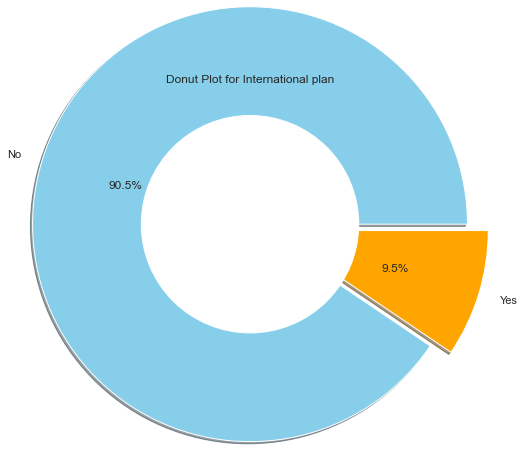

In [147]:
#To get the Donut Plot to analyze International Plan
plt.figure(figsize=(10,5))
data = churn_data['intl.plan'].value_counts()
explode = (0, 0.2)
plt.pie(data, explode = explode,autopct='%1.1f%%',shadow=True,radius = 2.0, labels = ['No','Yes'],colors=['skyblue' ,'orange'])
circle = plt.Circle( (0,0), 1, color='white')
p=plt.gcf()
p.gca().add_artist(circle)
plt.title('Donut Plot for International plan')
plt.show()

- There are 5000 people
- 495 have a International Plan
- 4505 do not have International Plan

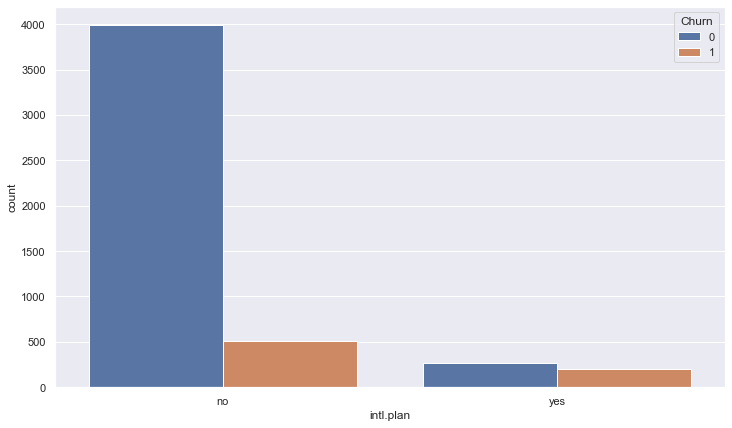

In [148]:
#Analysing by using countplot
sns.countplot(x='intl.plan',hue="Churn",data = churn_data)
plt.show()

- This is a count plot which shows the churned and not churned customer respective to their international plan

- From the above data we get

- There are 4505 customers who dont have a international plan.

- There are 495 customers who have a international plan.

- Among those who have a international plan 42.07 % people churn.

- Whereas among those who dont have a international plan only 11.2 % people churn.

- So basically the people who bought International plans are churning in big numbers.

- Probably because of connectivity issues or high call charge.

## Analyzing "Voice Mail Plan" column

In [149]:
#show the unique value of the "Voice mail plan" column
churn_data["voice.plan"].unique()

array(['yes', 'no'], dtype=object)

In [150]:
#Calculate the Voice Mail Plan vs Churn percentage
Voice_mail_plan_data = pd.crosstab(churn_data["voice.plan"],churn_data["Churn"])
Voice_mail_plan_data['Percentage Churn'] = Voice_mail_plan_data.apply(lambda x : x[1]*100/(x[0]+x[1]),axis = 1)
print(Voice_mail_plan_data)

Churn          0    1  Percentage Churn
voice.plan                             
no          3050  604         16.529830
yes         1214  101          7.680608


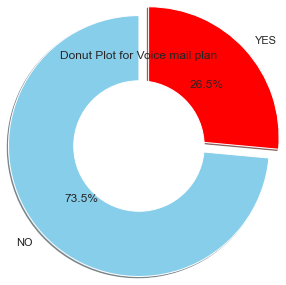

In [151]:
#To get the Donut Plot to analyze Voice mail plan
plt.figure(figsize=(7,3))
data = churn_data['voice.plan'].value_counts()
explode = (0, 0.2)
plt.pie(data, explode = explode,autopct='%1.1f%%',startangle=90,shadow=True,radius = 2.0, labels = ['NO','YES'],colors=['skyblue','red'])
circle = plt.Circle( (0,0), 1, color='white')
p=plt.gcf()
p.gca().add_artist(circle)
plt.title('Donut Plot for Voice mail plan')
plt.show()

- There are 4969 people,
- 1317 having Voicemail plan,
- 3652 do not have any Voicemail plan.

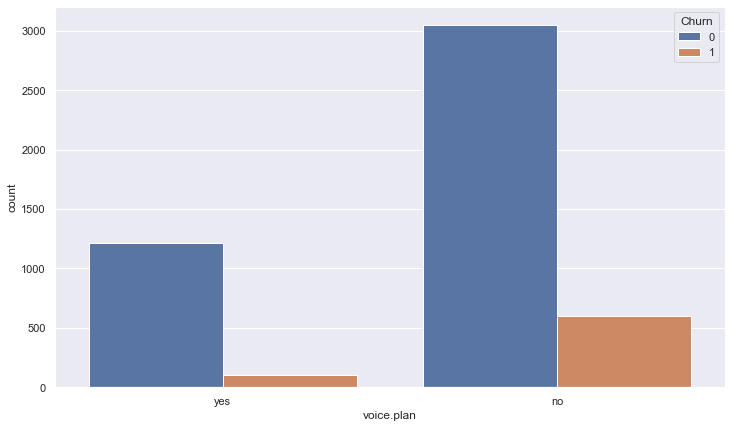

In [152]:
#Analysing by using countplot
sns.countplot(x='voice.plan',hue="Churn",data = churn_data)
plt.show()

- As we can see there is are no clear relation between voice mail plan and churn so we can't clearly say anything so let's move to the next voice mail feature i.e number of voice mail, let's see what it gives to us.
- This plot shows churn corresponding with the subscription of voicemail plan Out of 1317 people having Voicemail plan, 7.7% are Churn.

## Analyzing "voice messages" column


In [153]:
#show the data of 'Number vmail messages' 
churn_data['voice.messages'].unique()

array([25, 26,  0, 24, 37, 27, 33, 39, 30, 41, 28, 34, 46, 29, 35, 21, 32,
       42, 36, 22, 23, 43, 31, 38, 40, 48, 18, 17, 45, 16, 20, 14, 19, 51,
       15, 11, 12, 47,  8, 44, 49,  4, 10, 13, 50,  9,  6, 52],
      dtype=int64)

In [154]:
#Printing the data of 'Number vmail messages'
churn_data['voice.messages'].value_counts()    #The output will be sorted in descending order.

0     3655
31      83
28      67
29      67
33      66
24      63
27      63
30      58
26      57
32      56
23      52
25      51
22      47
36      44
37      43
34      41
39      41
35      41
21      41
38      40
20      31
40      28
19      27
41      22
17      21
42      19
18      18
16      17
43      16
15      13
45      11
12      11
14       9
44       9
46       8
48       5
13       4
47       4
10       4
49       3
6        2
9        2
50       2
11       2
8        2
4        1
51       1
52       1
Name: voice.messages, dtype: int64

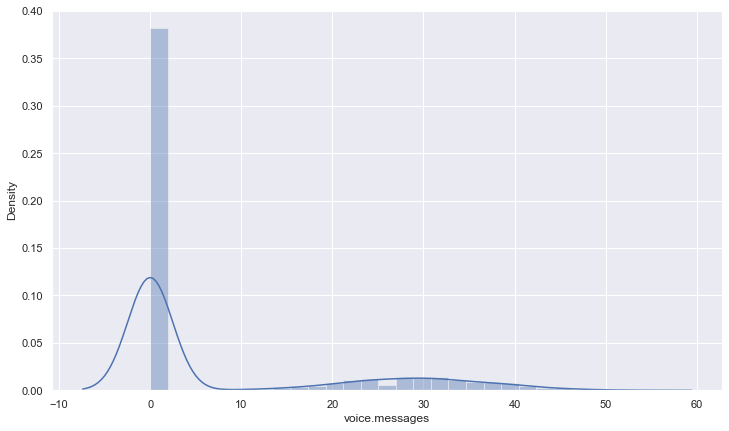

In [155]:
#Analysing by using displot diagram
sns.distplot(churn_data['voice.messages'])
plt.show()

<Figure size 720x576 with 0 Axes>

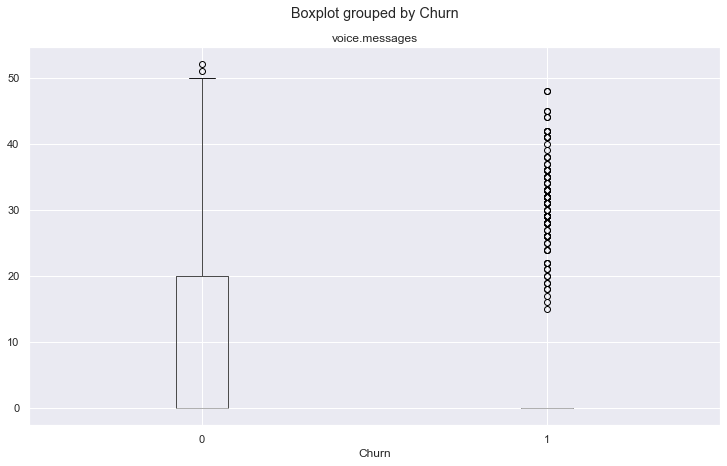

In [156]:
#Analysing by using boxplot diagram between 'number vmail messages' and 'churn'
fig = plt.figure(figsize =(10, 8)) 
churn_data.boxplot(column='voice.messages', by='Churn')
fig.suptitle('number of voice message', fontsize=14, fontweight='bold')
plt.show()

*After analyzing the above voice mail feature data we get an insight that when there are more than 20 voice-mail messages then there is a churn*

*For that, we need to improve the voice mail quality.*

## Analyzing "Customer service calls" column

In [157]:
#Printing the data of customer service calls 
churn_data['customer.calls'].value_counts()

1    1772
2    1123
0    1016
3     660
4     251
5      96
6      34
7      13
9       2
8       2
Name: customer.calls, dtype: int64

In [158]:
#Calculating the Customer service calls vs Churn percentage
Customer_service_calls_data = pd.crosstab(churn_data['customer.calls'],churn_data["Churn"])
Customer_service_calls_data['Percentage_Churn'] = Customer_service_calls_data.apply(lambda x : x[1]*100/(x[0]+x[1]),axis = 1)
print(Customer_service_calls_data)

Churn              0    1  Percentage_Churn
customer.calls                             
0                895  121         11.909449
1               1584  188         10.609481
2               1001  122         10.863758
3                587   73         11.060606
4                140  111         44.223108
5                 38   58         60.416667
6                 12   22         64.705882
7                  6    7         53.846154
8                  1    1         50.000000
9                  0    2        100.000000


- This table mapping number of customer calls to the churn percentage
- It’s clear that after 4 calls at least 44% of the subscribers churn.
- Customers with more than 4 service calls their probability of leaving is more

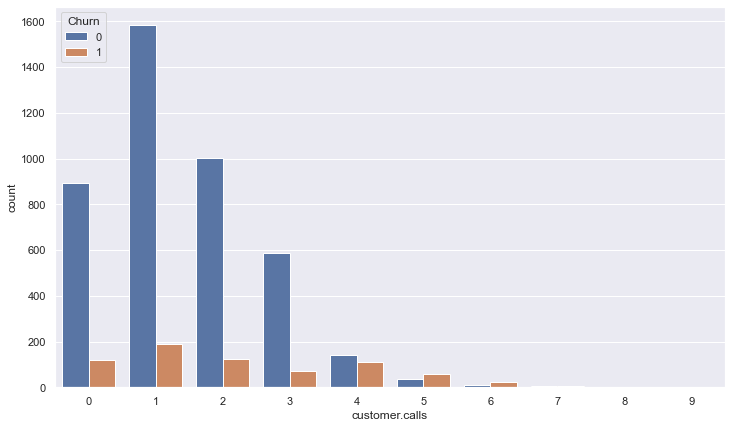

In [159]:
#Analysing using countplot
sns.countplot(x='customer.calls',hue="Churn",data = churn_data)
plt.show()

*  it is observed from the above analysis that, mostly because of bad customer service, people tend to leave the operator.
The above data indicating that those customers who called the service center 5 times or above those customer churn percentage is higher than 60%,And customers who have called once also have a high churn rate indicating their issue was not solved in the first attempt.
So operator should work to improve the service call.

## Analyzing all calls minutes,all calls, all calls charge together

* D A Y

In [160]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['day.calls'].mean())

Churn
0     99.892355
1    100.805674
Name: day.calls, dtype: float64


In [161]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['day.mins'].mean())

Churn
0    175.746177
1    207.886099
Name: day.mins, dtype: float64


In [162]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['day.charge'].mean())

Churn
0    29.877425
1    35.341064
Name: day.charge, dtype: float64


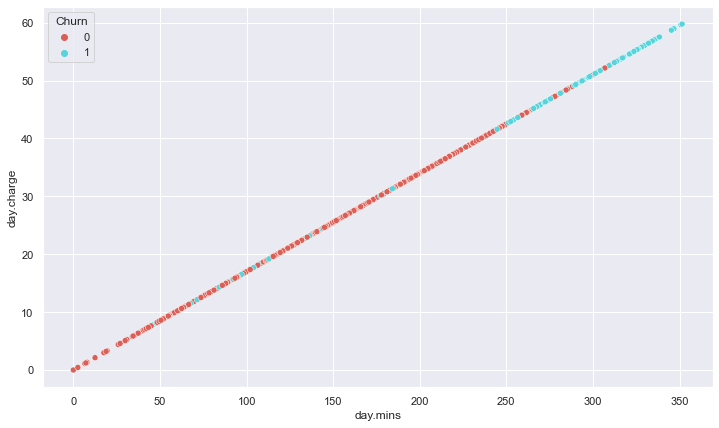

In [165]:
#show the relation using scatter plot
sns.scatterplot(x="day.mins", y="day.charge", hue="Churn", data=churn_data,palette='hls')
plt.show()

* In this graph we can see the frequent red-dotted line till 250 and above it we can see frequent blue-dotted Lines
* That means customer who are spending less than 250 minutes is happy with our telecom 
* And customer spending above 250 minutes is not satisfied with our telecom network so tend to churn to competitors

* E V E N I N G

In [166]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['eve.calls'].mean())

Churn
0    100.219512
1     99.904965
Name: eve.calls, dtype: float64


In [167]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['eve.mins'].mean())

Churn
0    198.786046
1    211.693617
Name: eve.mins, dtype: float64


In [168]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['eve.charge'].mean())

Churn
0    16.897045
1    17.994099
Name: eve.charge, dtype: float64


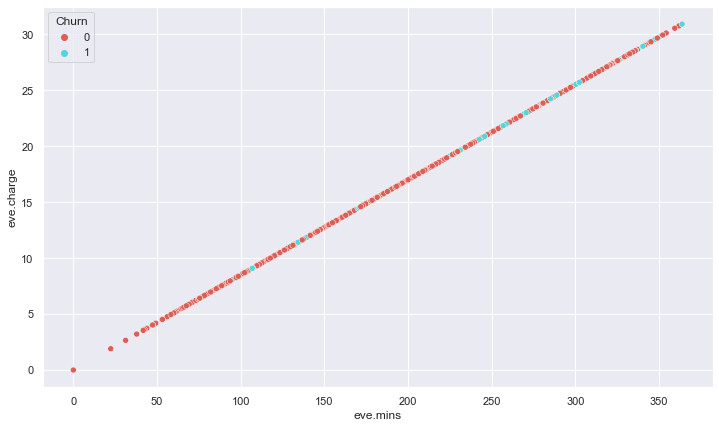

In [169]:
#show the relation using scatter plot
sns.scatterplot(x="eve.mins", y="eve.charge", hue="Churn", data=churn_data,palette='hls')
plt.show()

* Most of the customers are happy with the evening charges that we can only see less people churning away because of the evening charge issue 

* N I G H T

In [170]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['night.calls'].mean())

Churn
0    100.009146
1     99.624113
Name: night.calls, dtype: float64


In [171]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['night.mins'].mean())

Churn
0    199.500188
1    206.086667
Name: night.mins, dtype: float64


In [172]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['night.charge'].mean())

Churn
0    8.977622
1    9.273986
Name: night.charge, dtype: float64


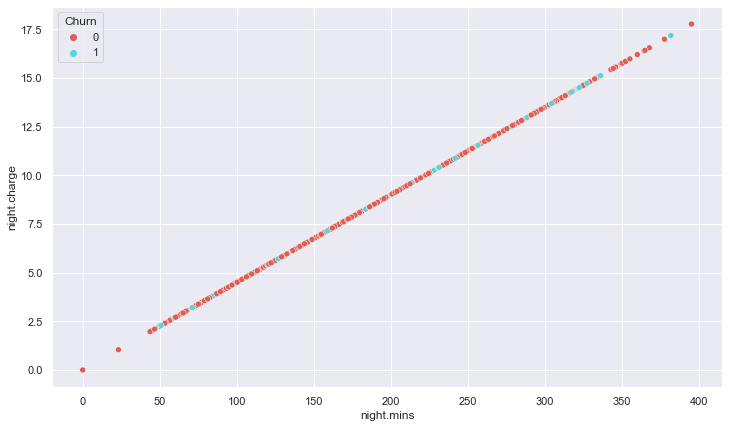

In [173]:
#show the relation of  using scatter plot
sns.scatterplot(x="night.mins", y="night.charge", hue="Churn", data=churn_data,palette='hls')
plt.show()

* I N T E R N A T I O N A L 

In [174]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['intl.calls'].mean())

Churn
0    4.479597
1    4.151773
Name: intl.calls, dtype: float64


In [175]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['intl.mins'].mean())

Churn
0    10.194536
1    10.685532
Name: intl.mins, dtype: float64


In [176]:
#Print the mean value of churned and not churned customer 
print(churn_data.groupby(["Churn"])['intl.charge'].mean())

Churn
0    2.753046
1    2.885589
Name: intl.charge, dtype: float64


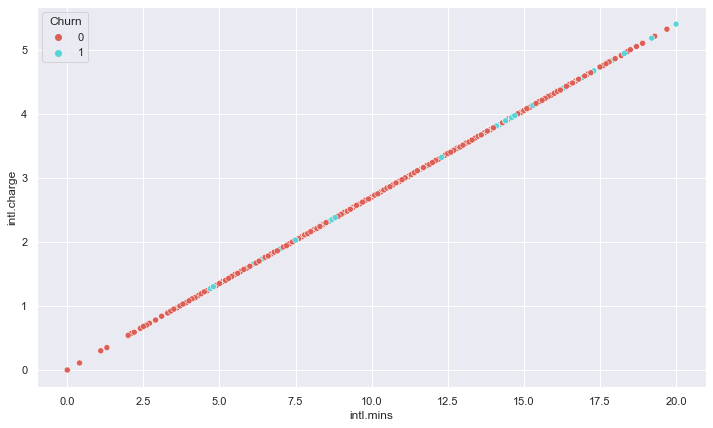

In [177]:
#show the relation of  using scatter plot
sns.scatterplot(x="intl.mins", y="intl.charge", hue="Churn", data=churn_data,palette='hls')
plt.show()

In [178]:
# converting call charge by category to call minutes   
daychrg_perminute = churn_data['day.charge'].mean()/churn_data['day.mins'].mean()
evechrg_perminute = churn_data['eve.charge'].mean()/churn_data['eve.mins'].mean()
nightchrg_perminute = churn_data['night.charge'].mean()/churn_data['night.mins'].mean()
intlchrg_perminute= churn_data['intl.charge'].mean()/churn_data['intl.mins'].mean()

In [179]:
print("Day Charge Per Minute :",round(daychrg_perminute,3))
print("Evening Charge Per Minute :",round(evechrg_perminute,3))
print("Night Charge Per Minute :",round(nightchrg_perminute,3))
print("International Charge Per Minute :",round(intlchrg_perminute,3))

Day Charge Per Minute : 0.17
Evening Charge Per Minute : 0.085
Night Charge Per Minute : 0.045
International Charge Per Minute : 0.27


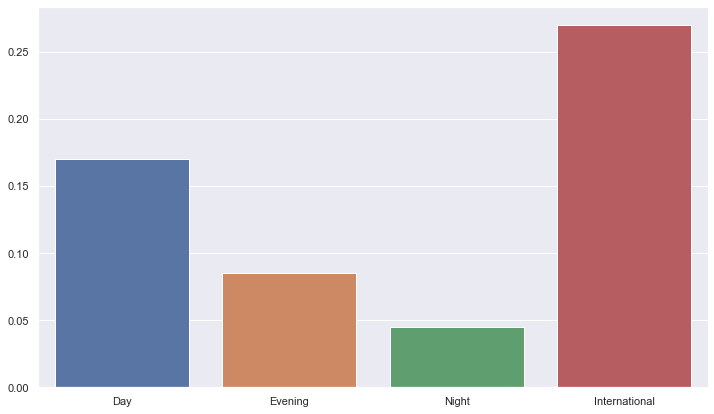

In [180]:
sns.barplot(x=['Day','Evening','Night','International'],y=[daychrg_perminute,evechrg_perminute,nightchrg_perminute,intlchrg_perminute])
plt.show()

* As the graph shows international plans charges highly so that there is a possibility that customers who use internaltional calls to churn out
* And also daycharges is also high compared to others

### Displot for each numerical column present in the data set

<Figure size 1224x72 with 0 Axes>

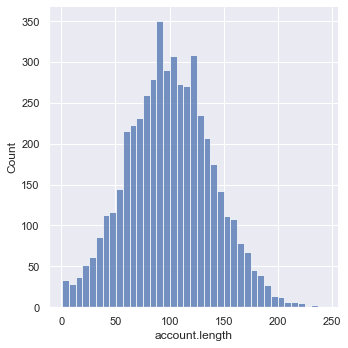

<Figure size 1224x72 with 0 Axes>

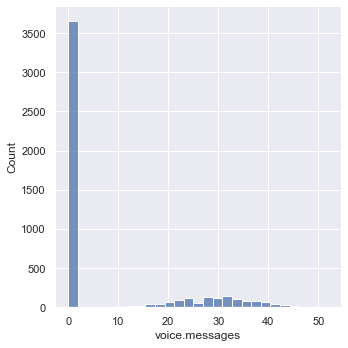

<Figure size 1224x72 with 0 Axes>

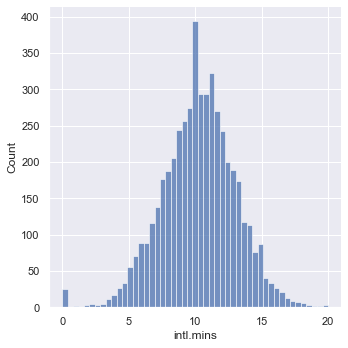

<Figure size 1224x72 with 0 Axes>

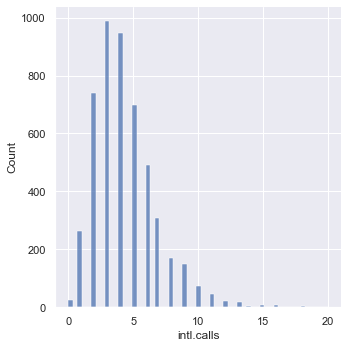

<Figure size 1224x72 with 0 Axes>

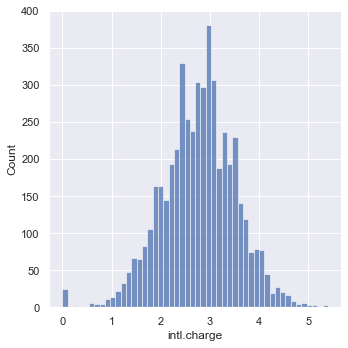

<Figure size 1224x72 with 0 Axes>

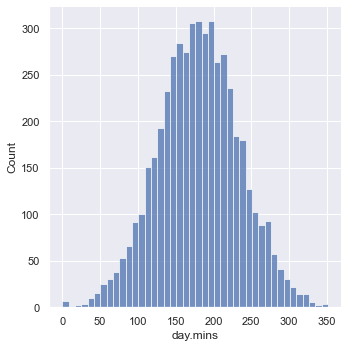

<Figure size 1224x72 with 0 Axes>

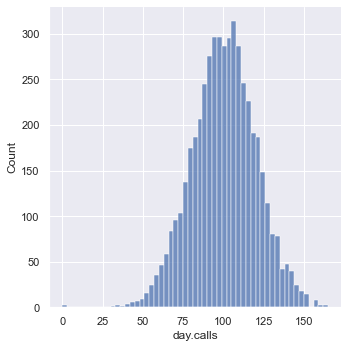

<Figure size 1224x72 with 0 Axes>

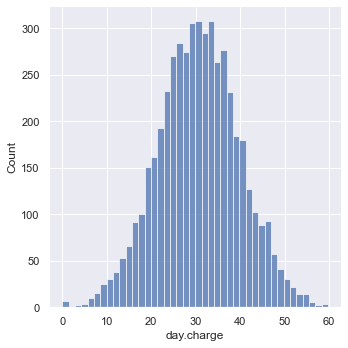

<Figure size 1224x72 with 0 Axes>

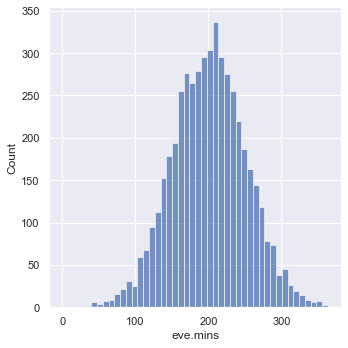

<Figure size 1224x72 with 0 Axes>

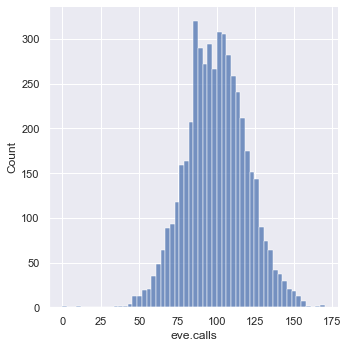

<Figure size 1224x72 with 0 Axes>

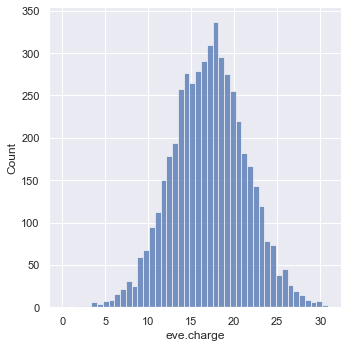

<Figure size 1224x72 with 0 Axes>

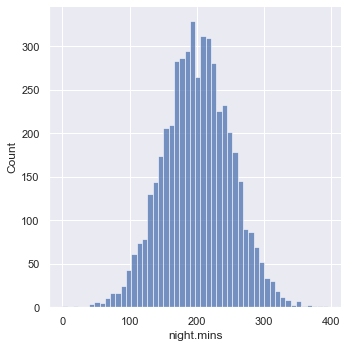

<Figure size 1224x72 with 0 Axes>

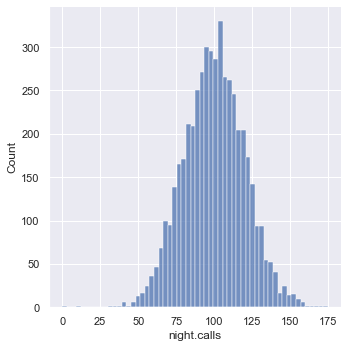

<Figure size 1224x72 with 0 Axes>

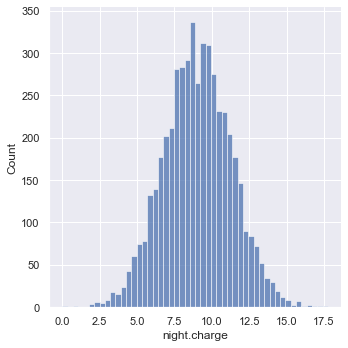

<Figure size 1224x72 with 0 Axes>

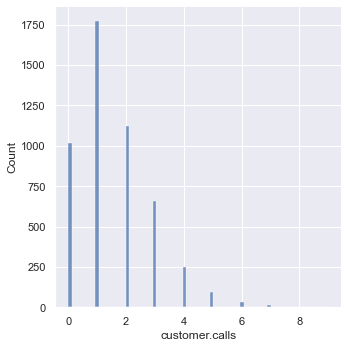

<Figure size 1224x72 with 0 Axes>

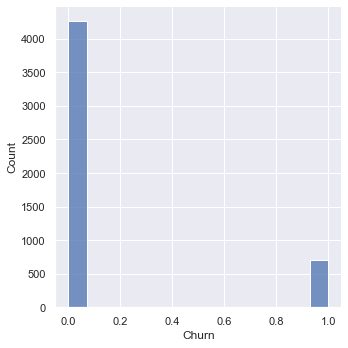

In [181]:
dist1=churn_data.select_dtypes(exclude=['object','bool'])
for column in dist1:
        plt.figure(figsize=(17,1))
        sns.displot(data=dist1, x=column)

plt.show()

#### Data Visualization End

# FEATURE ENGINEERING

In [182]:
churn_data

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,Churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,yes,40,no,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,0
4996,WV,area_code_415,152,no,0,no,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,1
4997,DC,area_code_415,61,no,0,no,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,0
4998,DC,area_code_510,109,no,0,no,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,0


<AxesSubplot:>

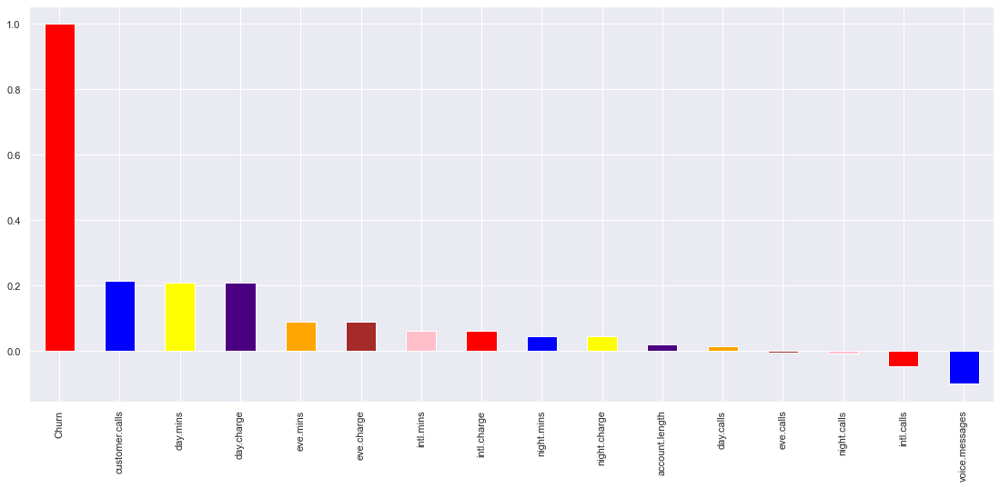

In [194]:
# visualization using correlation plot
plt.figure(figsize=(19,8))
churn_data.corr()['Churn'].sort_values(ascending = False).plot(kind='bar',color = ['red','blue','yellow','indigo','orange','brown','pink'])

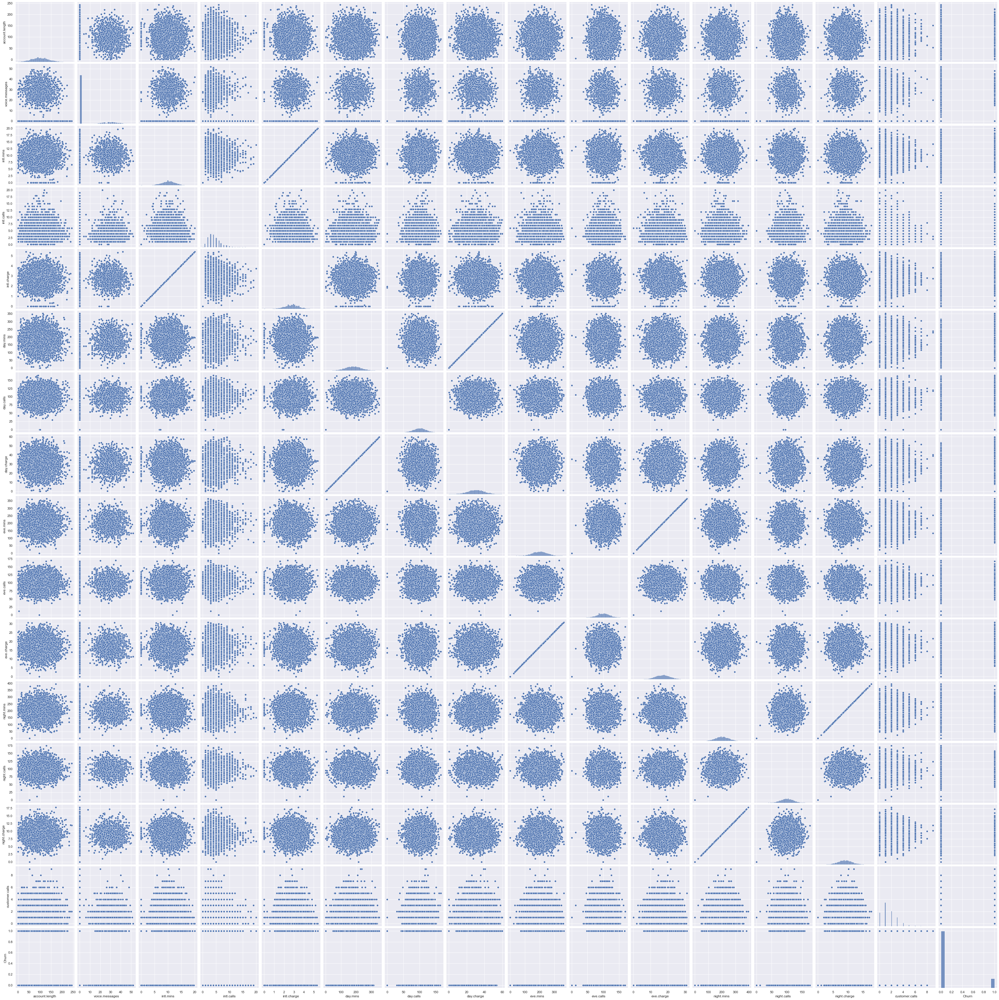

In [195]:
#plot the pair plot for all coloumn
sns.pairplot(churn_data, height=3)

<AxesSubplot:>

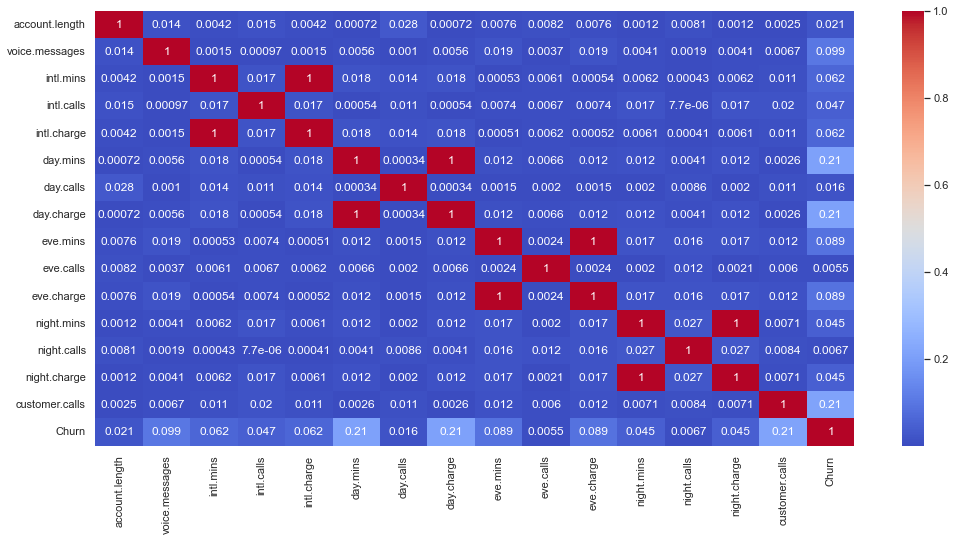

In [196]:
## plot the Correlation matrix
plt.figure(figsize=(17,8))
correlation=churn_data.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [197]:
df=churn_data.copy()

In [199]:
df.corr()["Churn"].sort_values()

voice.messages   -0.098588
intl.calls       -0.046513
night.calls      -0.006732
eve.calls        -0.005534
day.calls         0.016067
account.length    0.021307
night.charge      0.045484
night.mins        0.045488
intl.charge       0.062028
intl.mins         0.062034
eve.charge        0.089097
eve.mins          0.089104
day.charge        0.207956
day.mins          0.207961
customer.calls    0.213432
Churn             1.000000
Name: Churn, dtype: float64

### unnecessary columns

- voice.messages   -0.098588
- intl.calls       -0.046513
- night.calls      -0.006732
- eve.calls        -0.005534


In [204]:
X = churn_data.drop("Churn",axis=1)
y = churn_data["Churn"]

In [206]:
from sklearn.feature_selection import RFE

rfe = RFE(model, n_features_to_select=12) #Decision tree
fit = rfe.fit(X, y)

print(fit.n_features_,fit.support_,fit.ranking_)

ValueError: could not convert string to float: 'KS'